# ASHFORD and NEWBURY CRIME GEO MAP - 2020.01-2020.04

In [93]:
# later on I may use more out of these packages
import matplotlib.pyplot as plt
import pandas as pd
# before basemap it may need: conda install -c conda-forge basemap-data-hires=1.0.8.dev0
#from mpl_toolkits.basemap import Basemap
import numpy as np
#import shapefile as shp #pyshp library
#import seaborn as sns
import geopandas as gpd
# conda install folium -c conda-forge
#import folium

In [94]:
# I saved the map's coordinates in a tab sep txt file
coord_path = 'C:\\Datasets\\Crime_UK_2020\\map_coordinatesreadme.txt'
coord = pd.read_csv(coord_path,sep='\t')
coord

,name,long1,long2,lat1,lat2
0,ashford,-0.5416,-0.4111,51.4060,51.4700
1,newbury,-1.4131,-1.1522,51.3233,51.4517
2,newbury2,-1.3613,-1.2308,51.3680,51.4238


# ASHFORD: FIRST EXPERIMENT

### first assumption: metropolitan police is in charge in this area
#### downloaded crime data and the slice of the map as a picture for this exploration

In [95]:
# https://data.police.uk/data/
crime_pth1 = 'C:\\Datasets\\Crime_UK_2020\\2020-01-metropolitan-street.csv'
crime_pth2 = 'C:\\Datasets\\Crime_UK_2020\\2020-02-metropolitan-street.csv'
crime_pth3 = 'C:\\Datasets\\Crime_UK_2020\\2020-03-metropolitan-street.csv'
crime_pth4 = 'C:\\Datasets\\Crime_UK_2020\\2020-04-metropolitan-street.csv'
# background map from: https://www.openstreetmap.org/export#map=8/51.780/-0.978
ashford_pth= 'C:\\Datasets\\Crime_UK_2020\\ashford.png'

In [96]:
long1 = coord[coord.name=='ashford'].iloc[:,1].values[0]
long2 = coord[coord.name=='ashford'].iloc[:,2].values[0]
lat1 = coord[coord.name=='ashford'].iloc[:,3].values[0]
lat2 = coord[coord.name=='ashford'].iloc[:,4].values[0]
print(long1,long2,lat1,lat2)

-0.5416 -0.4111 51.406 51.47


In [97]:
# january
crime1 = pd.read_csv(crime_pth1)
print(f'Dimensions of the January crime data frame:',crime1.shape)
crime1 = crime1[crime1.Location != 'No Location']
print(f'Dimensions of the January crime data frame with location:',crime1.shape)
crime1 = crime1[(crime1.Longitude>=long1) & (crime1.Longitude<=long2) & (crime1.Latitude>=lat1) &
               (crime1.Latitude<=lat2)]
print(f'Filtered to the Ashford centered map box:',crime1.shape)
MapBox = ((crime1.Longitude.min(),crime1.Longitude.max(),      
         crime1.Latitude.min(), crime1.Latitude.max()))
MapBox2 = (long1,long2,lat1,lat2)
print(f'Data generated MapBox coordinates:',MapBox,f'\nMy predifined MapBox coordinates:' ,MapBox2)

Dimensions of the January crime data frame: (90979, 12)
Dimensions of the January crime data frame with location: (90435, 12)
Filtered to the Ashford centered map box: (436, 12)
Data generated MapBox coordinates: (-0.5145029999999999, -0.41110699999999994, 51.428956, 51.469778000000005) 
My predifined MapBox coordinates: (-0.5416, -0.4111, 51.406, 51.47)


In [98]:
# february
crime2 = pd.read_csv(crime_pth2)
print(crime2.shape)
crime2 = crime2[crime2.Location != 'No Location']
print(crime2.shape)
crime2 = crime2[(crime2.Longitude>=long1) & (crime2.Longitude<=long2) & (crime2.Latitude>=lat1) &
               (crime2.Latitude<=lat2)]
print(crime2.shape)

(86984, 12)
(86413, 12)
(353, 12)


In [99]:
# march
crime3 = pd.read_csv(crime_pth3)
print(crime3.shape)
crime3 = crime3[crime3.Location != 'No Location']
print(crime3.shape)
crime3 = crime3[(crime3.Longitude>=long1) & (crime3.Longitude<=long2) & (crime3.Latitude>=lat1) &
               (crime3.Latitude<=lat2)]
print(crime3.shape)

(87409, 12)
(86658, 12)
(418, 12)


In [100]:
# april
crime4 = pd.read_csv(crime_pth4)
print(crime4.shape)
crime4 = crime4[crime4.Location != 'No Location']
print(crime4.shape)
crime4 = crime4[(crime4.Longitude>=long1) & (crime4.Longitude<=long2) & (crime4.Latitude>=lat1) &
               (crime4.Latitude<=lat2)]
print(crime4.shape)

(109951, 12)
(109697, 12)
(626, 12)


In [101]:
# ingest the png file
ashford_map = plt.imread(ashford_pth)

### First map: base map is the png, crimes are points, different colours by months

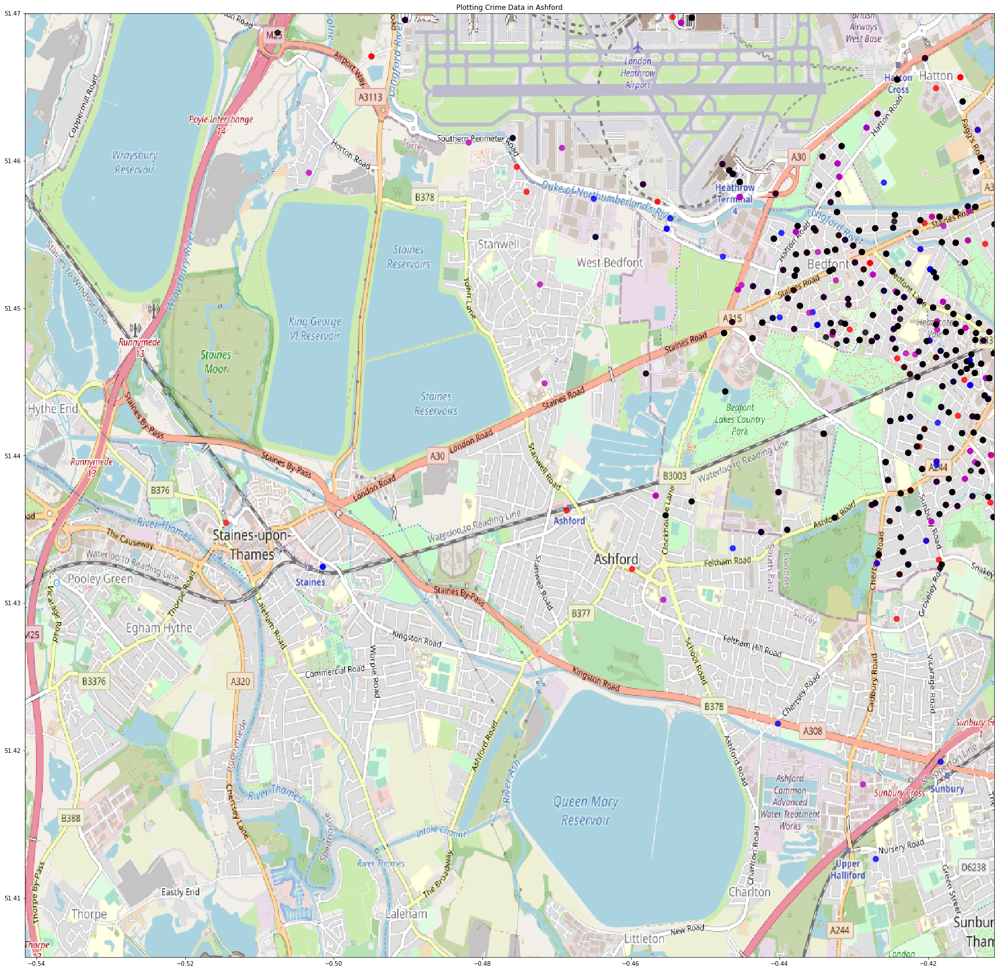

In [102]:
fig, ax = plt.subplots(figsize = (30,30))
ax.scatter(crime1.Longitude, crime1.Latitude, zorder=1, alpha= 0.8, c='r', s=90)
ax.scatter(crime2.Longitude, crime2.Latitude, zorder=2, alpha= 0.8, c='b', s=90)
ax.scatter(crime3.Longitude, crime3.Latitude, zorder=3, alpha= 0.8, c='m', s=90)
ax.scatter(crime4.Longitude, crime4.Latitude, zorder=4, alpha= 0.8, c='k', s=90)
ax.set_title('Plotting Crime Data in Ashford')
ax.set_xlim(MapBox2[0],MapBox2[1])# not necessary at the moment
ax.set_ylim(MapBox2[2],MapBox2[3])# not necessary at the moment
ax.imshow(ashford_map, zorder=0, extent = MapBox2, aspect= 'auto')

plt.show()

### seems very empty on the west, south-west area

## Let's understand a bit the data

In [103]:
# merge the 4 months
crime1_4 = pd.concat([crime1,crime2,crime3,crime4])
crime1_4.shape

(1833, 12)

## Crime type frequencies

In [104]:
print(crime1_4.groupby('Crime type').count()[['Month']])
loc_freq = crime1_4.groupby(['Longitude','Latitude']).count()[['Month']]
print('\nMaximum number of crime in one scene:', loc_freq.max()[0])
mflong = loc_freq[loc_freq.Month==loc_freq.max()[0]].reset_index().iloc[0,0]
mflat = loc_freq[loc_freq.Month==loc_freq.max()[0]].reset_index().iloc[0,1]
print(f'The coordinates of this crime scene:',mflong,mflat)

                              Month
Crime type                         
Anti-social behaviour           549
Bicycle theft                     9
Burglary                         51
Criminal damage and arson        88
Drugs                            78
Other crime                      91
Other theft                     198
Possession of weapons            12
Public order                     69
Robbery                          13
Shoplifting                      70
Theft from the person            16
Vehicle crime                   208
Violence and sexual offences    381

Maximum number of crime in one scene: 189
The coordinates of this crime scene: -0.451842 51.469708000000004


In [105]:
#loc_freq[loc_freq.Month==loc_freq.max()[0]].reset_index().iloc[0,1]

## Show the busiest scene on the map

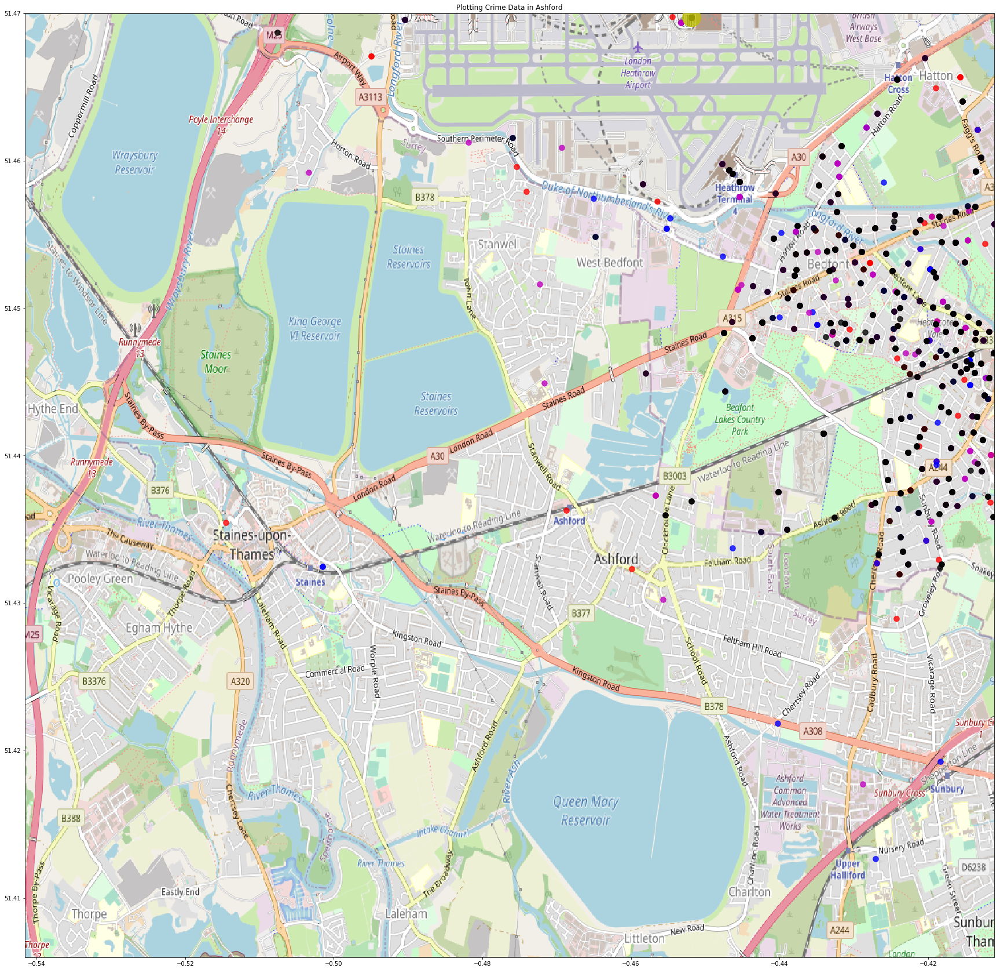

In [106]:
# POINT OF THE MOST BUSY PLACE - YELLOW

fig, ax = plt.subplots(figsize = (30,30))
ax.scatter(crime1.Longitude, crime1.Latitude, zorder=1, alpha= 0.8, c='r', s=90)
ax.scatter(crime2.Longitude, crime2.Latitude, zorder=2, alpha= 0.8, c='b', s=90)
ax.scatter(crime3.Longitude, crime3.Latitude, zorder=3, alpha= 0.8, c='m', s=90)
ax.scatter(crime4.Longitude, crime4.Latitude, zorder=4, alpha= 0.8, c='k', s=90)

ax.scatter(mflong, mflat, alpha= 0.8, zorder=5, c='y', s=1000)

ax.set_title('Plotting Crime Data in Ashford')
ax.set_xlim(MapBox2[0],MapBox2[1])# not necessary at the moment
ax.set_ylim(MapBox2[2],MapBox2[3])# not necessary at the moment
ax.imshow(ashford_map, zorder=0, extent = MapBox2, aspect= 'auto')

plt.show()

### busiest crime scene seems to be in the parking area of Heathrow Airport

## Weight the points with frequency

In [107]:
loc_freq = crime1_4.groupby(['Longitude','Latitude']).count()[['Month']].reset_index()

loc_freq.head()

,Longitude,Latitude,Month
0,-0.514503,51.435484,1
1,-0.507622,51.468713,1
2,-0.503413,51.459191,1
3,-0.501494,51.432495,2
4,-0.494977,51.467095,2


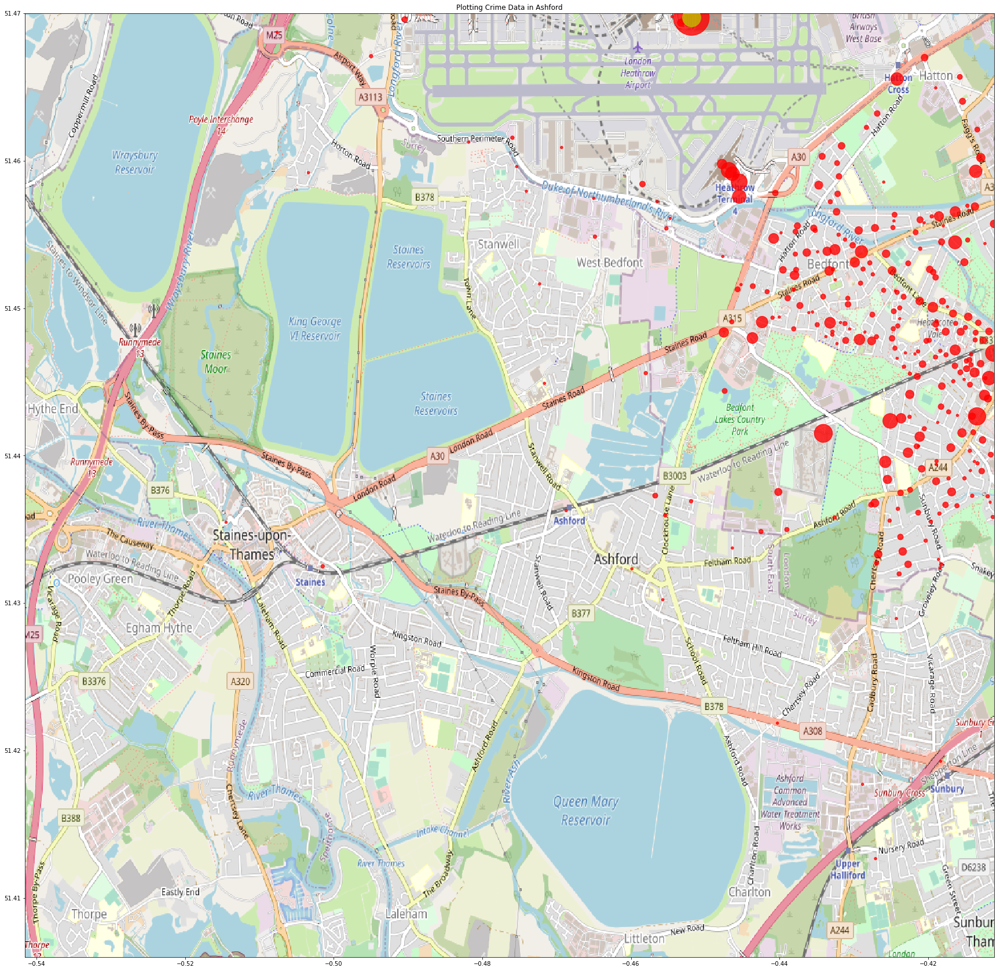

In [108]:
fig, ax = plt.subplots(figsize = (30,30))
ax.scatter(loc_freq.Longitude, loc_freq.Latitude, zorder=1, alpha= 0.8, c='r', s=loc_freq.Month*20)

ax.scatter(mflong, mflat, alpha= 0.8, zorder=5, c='y', s=1000)

ax.set_title('Plotting Crime Data in Ashford')
ax.set_xlim(MapBox2[0],MapBox2[1])# not necessary at the moment
ax.set_ylim(MapBox2[2],MapBox2[3])# not necessary at the moment
ax.imshow(ashford_map, zorder=0, extent = MapBox2, aspect= 'auto')

plt.show()

# ASHFORD: SECOND EXPERIMENT

# Where are the rest of the crimes?
### 1. transport police: e.g. 2020-01-btp-street.csv
### 2. surrey: e.g 2020-01-surrey-street.csv
### 3. thames valley: e.g 2020-01-thames-valley-street.csv

In [109]:
# https://data.police.uk/data/
crime_pth1_2 = 'C:\\Datasets\\Crime_UK_2020\\2020-01-btp-street.csv'
crime_pth2_2 = 'C:\\Datasets\\Crime_UK_2020\\2020-02-btp-street.csv'
crime_pth3_2 = 'C:\\Datasets\\Crime_UK_2020\\2020-03-btp-street.csv'
crime_pth4_2 = 'C:\\Datasets\\Crime_UK_2020\\2020-04-btp-street.csv'

crime_pth1_3 = 'C:\\Datasets\\Crime_UK_2020\\2020-01-surrey-street.csv'
crime_pth2_3 = 'C:\\Datasets\\Crime_UK_2020\\2020-02-surrey-street.csv'
crime_pth3_3 = 'C:\\Datasets\\Crime_UK_2020\\2020-03-surrey-street.csv'
crime_pth4_3 = 'C:\\Datasets\\Crime_UK_2020\\2020-04-surrey-street.csv'

crime_pth1_4 = 'C:\\Datasets\\Crime_UK_2020\\2020-01-thames-valley-street.csv'
crime_pth2_4 = 'C:\\Datasets\\Crime_UK_2020\\2020-02-thames-valley-street.csv'
crime_pth3_4 = 'C:\\Datasets\\Crime_UK_2020\\2020-03-thames-valley-street.csv'
crime_pth4_4 = 'C:\\Datasets\\Crime_UK_2020\\2020-04-thames-valley-street.csv'

In [110]:
# merge all the data in one data frame

paths = [crime_pth1,crime_pth2,crime_pth3,crime_pth4,
         crime_pth1_2,crime_pth2_2,crime_pth3_2,crime_pth4_2,
         crime_pth1_3,crime_pth2_3,crime_pth3_3,crime_pth4_3,
         crime_pth1_4,crime_pth2_4,crime_pth3_4,crime_pth4_4]

crime_all=pd.DataFrame(columns=['Crime ID','Month','Reported by','Falls within','Longitude',
                               'Latitude','Location','LSOA code','LSOA name','Crime type',
                               'Last outcome category','Context'])
for i in range(len(paths)):
    print(i,paths[i] )
    crime_all=crime_all.append(pd.read_csv(paths[i]))
#crime_all = pd.concat([crime1,crime2,crime3,crime4])

0 C:\Datasets\Crime_UK_2020\2020-01-metropolitan-street.csv
1 C:\Datasets\Crime_UK_2020\2020-02-metropolitan-street.csv
2 C:\Datasets\Crime_UK_2020\2020-03-metropolitan-street.csv
3 C:\Datasets\Crime_UK_2020\2020-04-metropolitan-street.csv
4 C:\Datasets\Crime_UK_2020\2020-01-btp-street.csv
5 C:\Datasets\Crime_UK_2020\2020-02-btp-street.csv
6 C:\Datasets\Crime_UK_2020\2020-03-btp-street.csv
7 C:\Datasets\Crime_UK_2020\2020-04-btp-street.csv
8 C:\Datasets\Crime_UK_2020\2020-01-surrey-street.csv
9 C:\Datasets\Crime_UK_2020\2020-02-surrey-street.csv
10 C:\Datasets\Crime_UK_2020\2020-03-surrey-street.csv
11 C:\Datasets\Crime_UK_2020\2020-04-surrey-street.csv
12 C:\Datasets\Crime_UK_2020\2020-01-thames-valley-street.csv
13 C:\Datasets\Crime_UK_2020\2020-02-thames-valley-street.csv
14 C:\Datasets\Crime_UK_2020\2020-03-thames-valley-street.csv
15 C:\Datasets\Crime_UK_2020\2020-04-thames-valley-street.csv


In [111]:
print('merged data dimension:',crime_all.shape)

merged data dimension: (486003, 12)


In [112]:
long1 = coord[coord.name=='ashford'].iloc[:,1].values[0]
long2 = coord[coord.name=='ashford'].iloc[:,2].values[0]
lat1 = coord[coord.name=='ashford'].iloc[:,3].values[0]
lat2 = coord[coord.name=='ashford'].iloc[:,4].values[0]
print(long1,long2,lat1,lat2)

-0.5416 -0.4111 51.406 51.47


In [113]:
crime_all = crime_all[crime_all.Location != 'No Location']
print('merged data with location data dimension:',crime_all.shape)
crime_all = crime_all[(crime_all.Longitude>=long1) & (crime_all.Longitude<=long2) & (crime_all.Latitude>=lat1) &
               (crime_all.Latitude<=lat2)]
print('in the box data dimension:',crime_all.shape)
MapBox = ((crime_all.Longitude.min(),crime_all.Longitude.max(),      
         crime_all.Latitude.min(), crime_all.Latitude.max()))
MapBox2 = (long1,long2,lat1,lat2)

print(f'Data generated MapBox coordinates:',MapBox,f'\nMy predifined MapBox coordinates:' ,MapBox2)

merged data with location data dimension: (475737, 12)
in the box data dimension: (5253, 12)
Data generated MapBox coordinates: (-0.541568, -0.41110699999999994, 51.406003999999996, 51.469986999999996) 
My predifined MapBox coordinates: (-0.5416, -0.4111, 51.406, 51.47)


## Crime type frequencies:

In [114]:
print(crime_all.groupby('Crime type').count()[['Month']])
loc_freq = crime_all.groupby(['Longitude','Latitude']).count()[['Month']]
print('\nMaximum number of crime in one scene:', loc_freq.max()[0])
mflong = loc_freq[loc_freq.Month==loc_freq.max()[0]].reset_index().iloc[0,0]
mflat = loc_freq[loc_freq.Month==loc_freq.max()[0]].reset_index().iloc[0,1]
print(f'The coordinates of this crime scene:',mflong,mflat)

                              Month
Crime type                         
Anti-social behaviour          1471
Bicycle theft                    41
Burglary                        240
Criminal damage and arson       398
Drugs                           205
Other crime                     154
Other theft                     372
Possession of weapons            38
Public order                    344
Robbery                          28
Shoplifting                     165
Theft from the person            41
Vehicle crime                   500
Violence and sexual offences   1256

Maximum number of crime in one scene: 189
The coordinates of this crime scene: -0.451842 51.469708000000004


In [115]:
loc_freq = crime_all.groupby(['Longitude','Latitude']).count()[['Month']].reset_index()

loc_freq.head()

,Longitude,Latitude,Month
0,-0.541568,51.434466,1
1,-0.541514,51.443845,1
2,-0.541433,51.440085,1
3,-0.540932,51.432768,8
4,-0.540516,51.407000,2


# NEW MAP WITH THE MERGED DATA

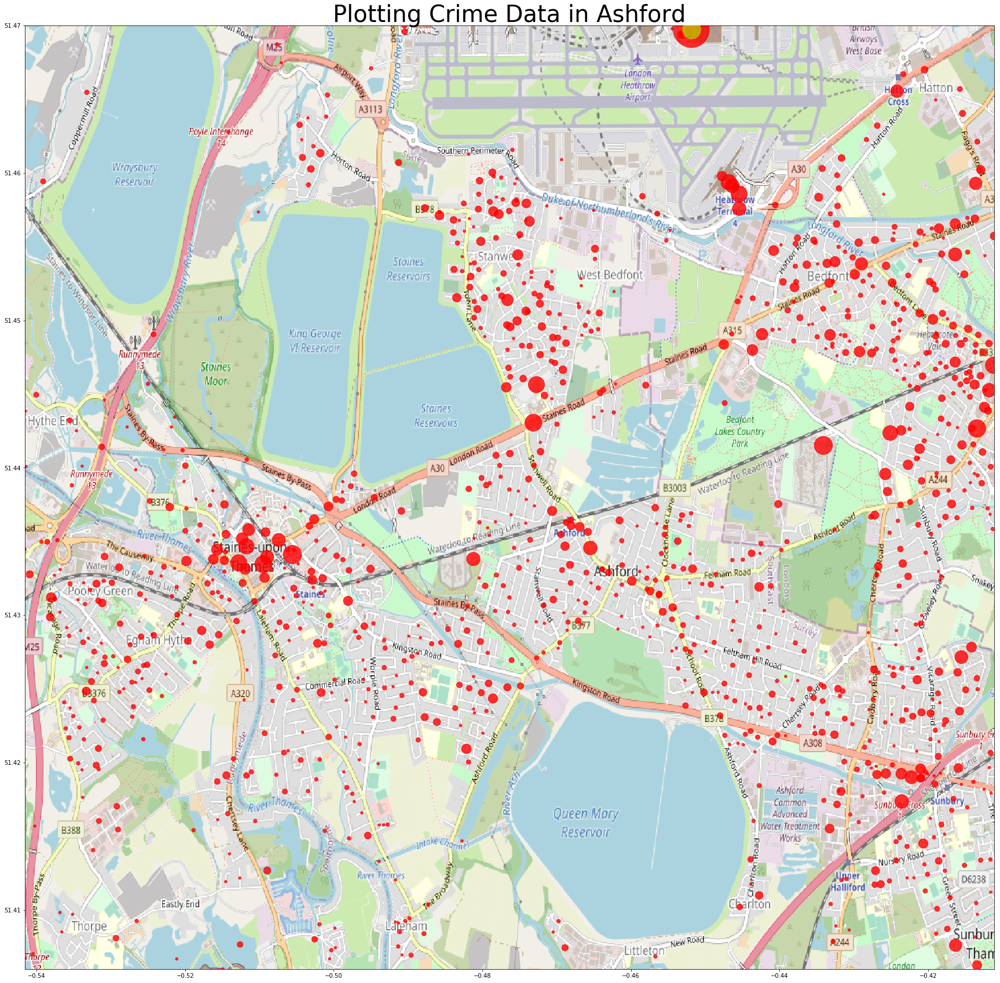

In [116]:
fig, ax = plt.subplots(figsize = (30,30))
ax.scatter(loc_freq.Longitude, loc_freq.Latitude, zorder=1, alpha= 0.8, c='r', s=loc_freq.Month*20)

ax.scatter(mflong, mflat, alpha= 0.8, zorder=5, c='y', s=1000)

ax.set_title('Plotting Crime Data in Ashford', fontsize=40)
ax.set_xlim(MapBox2[0],MapBox2[1])# not necessary at the moment
ax.set_ylim(MapBox2[2],MapBox2[3])# not necessary at the moment
ax.imshow(ashford_map, zorder=0, extent = MapBox2, aspect= 'auto')

plt.show()

# NEWBURY: FIRST EXPERIMENT

### The whole area is under the Thames Valley Police

In [117]:
# https://data.police.uk/data/
crime_pth1_4 = 'C:\\Datasets\\Crime_UK_2020\\2020-01-thames-valley-street.csv'
crime_pth2_4 = 'C:\\Datasets\\Crime_UK_2020\\2020-02-thames-valley-street.csv'
crime_pth3_4 = 'C:\\Datasets\\Crime_UK_2020\\2020-03-thames-valley-street.csv'
crime_pth4_4 = 'C:\\Datasets\\Crime_UK_2020\\2020-04-thames-valley-street.csv'
# background map from: https://www.openstreetmap.org/export#map=8/51.780/-0.978
newbury_pth= 'C:\\Datasets\\Crime_UK_2020\\newbury.png'

In [118]:
# Merge the 4 months data
paths = [crime_pth1_4,crime_pth2_4,crime_pth3_4,crime_pth4_4]

crime_all=pd.DataFrame(columns=['Crime ID','Month','Reported by','Falls within','Longitude',
                               'Latitude','Location','LSOA code','LSOA name','Crime type',
                               'Last outcome category','Context'])
for i in range(len(paths)):
    print(i,paths[i] )
    crime_all=crime_all.append(pd.read_csv(paths[i]))

0 C:\Datasets\Crime_UK_2020\2020-01-thames-valley-street.csv
1 C:\Datasets\Crime_UK_2020\2020-02-thames-valley-street.csv
2 C:\Datasets\Crime_UK_2020\2020-03-thames-valley-street.csv
3 C:\Datasets\Crime_UK_2020\2020-04-thames-valley-street.csv


In [119]:
crime_all.shape

(62170, 12)

In [120]:
# load the Newbury map
newbury_map = plt.imread(newbury_pth)

In [121]:
long1 = coord[coord.name=='newbury'].iloc[:,1].values[0]
long2 = coord[coord.name=='newbury'].iloc[:,2].values[0]
lat1 = coord[coord.name=='newbury'].iloc[:,3].values[0]
lat2 = coord[coord.name=='newbury'].iloc[:,4].values[0]

In [122]:
print(long1,long2,lat1,lat2)

-1.4131 -1.1522 51.3233 51.4517


In [123]:
crime_all = crime_all[crime_all.Location != 'No Location']
print('merged data with location data dimension:',crime_all.shape)
crime_all = crime_all[(crime_all.Longitude>=long1) & (crime_all.Longitude<=long2) & (crime_all.Latitude>=lat1) &
               (crime_all.Latitude<=lat2)]
print('in the box data dimension:',crime_all.shape)
MapBox = ((crime_all.Longitude.min(),crime_all.Longitude.max(),      
         crime_all.Latitude.min(), crime_all.Latitude.max()))
MapBox2 = (long1,long2,lat1,lat2)

print(f'Data generated MapBox coordinates:',MapBox,f'\nMy predifined MapBox coordinates:' ,MapBox2)

merged data with location data dimension: (54623, 12)
in the box data dimension: (1749, 12)
Data generated MapBox coordinates: (-1.4027209999999999, -1.1526610000000002, 51.361376, 51.450751000000004) 
My predifined MapBox coordinates: (-1.4131, -1.1522, 51.3233, 51.4517)


## Crime type frequencies:

In [124]:
print(crime_all.groupby('Crime type').count()[['Month']])
loc_freq = crime_all.groupby(['Longitude','Latitude']).count()[['Month']]
print('\nMaximum number of crime in one scene:', loc_freq.max()[0])
mflong = loc_freq[loc_freq.Month==loc_freq.max()[0]].reset_index().iloc[0,0]
mflat = loc_freq[loc_freq.Month==loc_freq.max()[0]].reset_index().iloc[0,1]
print(f'The coordinates of this crime scene:',mflong,mflat)

                              Month
Crime type                         
Anti-social behaviour           269
Bicycle theft                    20
Burglary                         88
Criminal damage and arson       205
Drugs                            81
Other crime                      28
Other theft                     130
Possession of weapons            12
Public order                     56
Robbery                          11
Shoplifting                     129
Theft from the person            18
Vehicle crime                   133
Violence and sexual offences    569

Maximum number of crime in one scene: 60
The coordinates of this crime scene: -1.248739 51.384985


In [125]:
loc_freq = crime_all.groupby(['Longitude','Latitude']).count()[['Month']].reset_index()

loc_freq.head()

,Longitude,Latitude,Month
0,-1.402721,51.446430,1
1,-1.400298,51.390768,2
2,-1.392130,51.443247,4
3,-1.384853,51.376526,1
4,-1.377250,51.380928,3


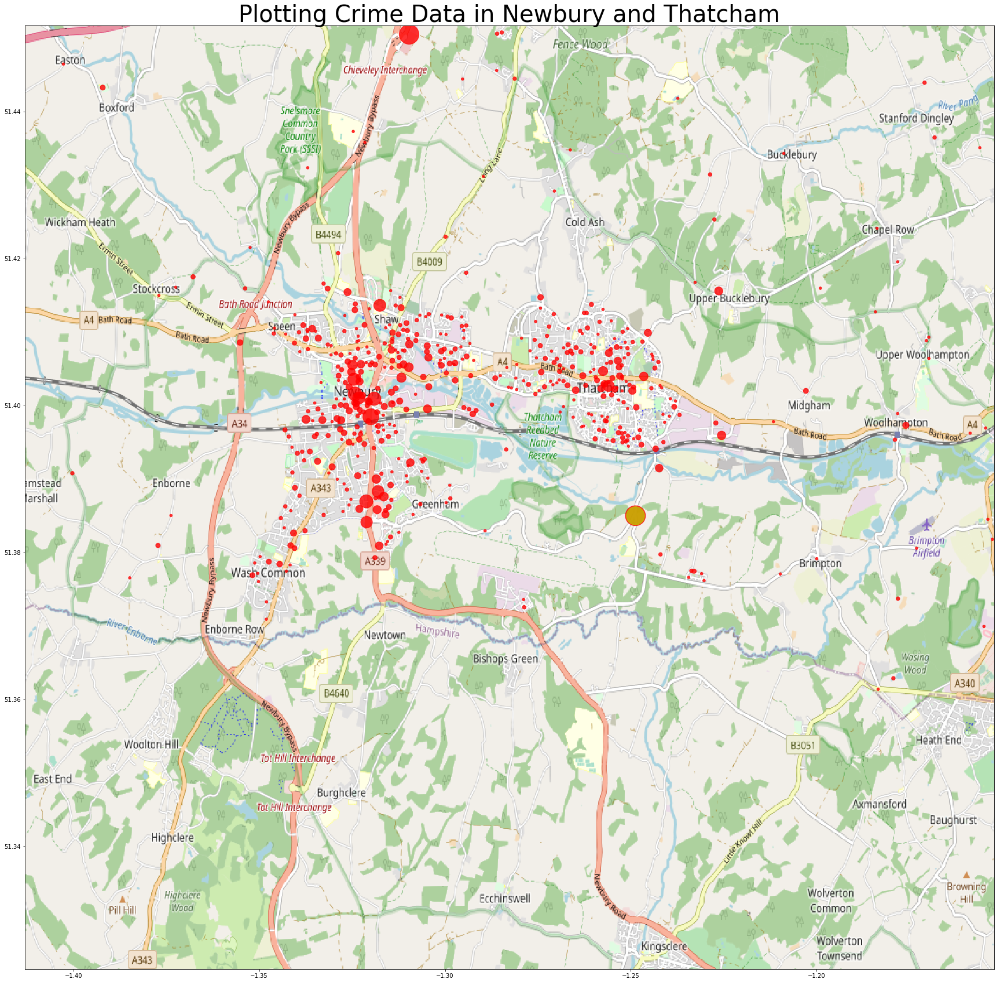

In [126]:
fig, ax = plt.subplots(figsize = (30,30))
ax.scatter(loc_freq.Longitude, loc_freq.Latitude, zorder=1, alpha= 0.8, c='r', s=loc_freq.Month*20)

ax.scatter(mflong, mflat, alpha= 0.8, zorder=5, c='y', s=1000)

ax.set_title('Plotting Crime Data in Newbury and Thatcham', fontsize=40)
ax.set_xlim(MapBox2[0],MapBox2[1])# not necessary at the moment
ax.set_ylim(MapBox2[2],MapBox2[3])# not necessary at the moment
ax.imshow(newbury_map, zorder=0, extent = MapBox2, aspect= 'auto')

plt.show()

## it seems Hampshire is not there

# NEWBURY: CLOSE UP

In [127]:
# https://data.police.uk/data/
crime_pth1_4 = 'C:\\Datasets\\Crime_UK_2020\\2020-01-thames-valley-street.csv'
crime_pth2_4 = 'C:\\Datasets\\Crime_UK_2020\\2020-02-thames-valley-street.csv'
crime_pth3_4 = 'C:\\Datasets\\Crime_UK_2020\\2020-03-thames-valley-street.csv'
crime_pth4_4 = 'C:\\Datasets\\Crime_UK_2020\\2020-04-thames-valley-street.csv'
# background map from: https://www.openstreetmap.org/export#map=8/51.780/-0.978
newbury_pth2= 'C:\\Datasets\\Crime_UK_2020\\newbury2.png'

In [128]:
# Merge the 4 months data
paths = [crime_pth1_4,crime_pth2_4,crime_pth3_4,crime_pth4_4]

crime_all=pd.DataFrame(columns=['Crime ID','Month','Reported by','Falls within','Longitude',
                               'Latitude','Location','LSOA code','LSOA name','Crime type',
                               'Last outcome category','Context'])
for i in range(len(paths)):
    print(i,paths[i] )
    crime_all=crime_all.append(pd.read_csv(paths[i]))

0 C:\Datasets\Crime_UK_2020\2020-01-thames-valley-street.csv
1 C:\Datasets\Crime_UK_2020\2020-02-thames-valley-street.csv
2 C:\Datasets\Crime_UK_2020\2020-03-thames-valley-street.csv
3 C:\Datasets\Crime_UK_2020\2020-04-thames-valley-street.csv


In [129]:
crime_all.shape
# load the Newbury map
newbury_map2 = plt.imread(newbury_pth2)

In [130]:
long1 = coord[coord.name=='newbury2'].iloc[:,1].values[0]
long2 = coord[coord.name=='newbury2'].iloc[:,2].values[0]
lat1 = coord[coord.name=='newbury2'].iloc[:,3].values[0]
lat2 = coord[coord.name=='newbury2'].iloc[:,4].values[0]

In [131]:
print(long1,long2,lat1,lat2)

-1.3613 -1.2308 51.368 51.4238


In [132]:
crime_all = crime_all[crime_all.Location != 'No Location']
print('merged data with location data dimension:',crime_all.shape)
crime_all = crime_all[(crime_all.Longitude>=long1) & (crime_all.Longitude<=long2) & (crime_all.Latitude>=lat1) &
               (crime_all.Latitude<=lat2)]
print('in the box data dimension:',crime_all.shape)
MapBox = ((crime_all.Longitude.min(),crime_all.Longitude.max(),      
         crime_all.Latitude.min(), crime_all.Latitude.max()))
MapBox2 = (long1,long2,lat1,lat2)

print(f'Data generated MapBox coordinates:',MapBox,f'\nMy predifined MapBox coordinates:' ,MapBox2)

merged data with location data dimension: (54623, 12)
in the box data dimension: (1590, 12)
Data generated MapBox coordinates: (-1.355165, -1.230923, 51.370905, 51.422940999999994) 
My predifined MapBox coordinates: (-1.3613, -1.2308, 51.368, 51.4238)


## Crime type frequencies:

In [133]:
print(crime_all.groupby('Crime type').count()[['Month']])
loc_freq = crime_all.groupby(['Longitude','Latitude']).count()[['Month']]
print('\nMaximum number of crime in one scene:', loc_freq.max()[0])
mflong = loc_freq[loc_freq.Month==loc_freq.max()[0]].reset_index().iloc[0,0]
mflat = loc_freq[loc_freq.Month==loc_freq.max()[0]].reset_index().iloc[0,1]
print(f'The coordinates of this crime scene:',mflong,mflat)

                              Month
Crime type                         
Anti-social behaviour           261
Bicycle theft                    19
Burglary                         78
Criminal damage and arson       185
Drugs                            76
Other crime                      24
Other theft                      96
Possession of weapons            10
Public order                     53
Robbery                          11
Shoplifting                     128
Theft from the person            16
Vehicle crime                    99
Violence and sexual offences    534

Maximum number of crime in one scene: 60
The coordinates of this crime scene: -1.248739 51.384985


In [134]:
loc_freq = crime_all.groupby(['Longitude','Latitude']).count()[['Month']].reset_index()

loc_freq.head()

,Longitude,Latitude,Month
0,-1.355165,51.408548,5
1,-1.353781,51.415914,2
2,-1.352452,51.421490,1
3,-1.351831,51.376879,4
4,-1.351218,51.378557,1


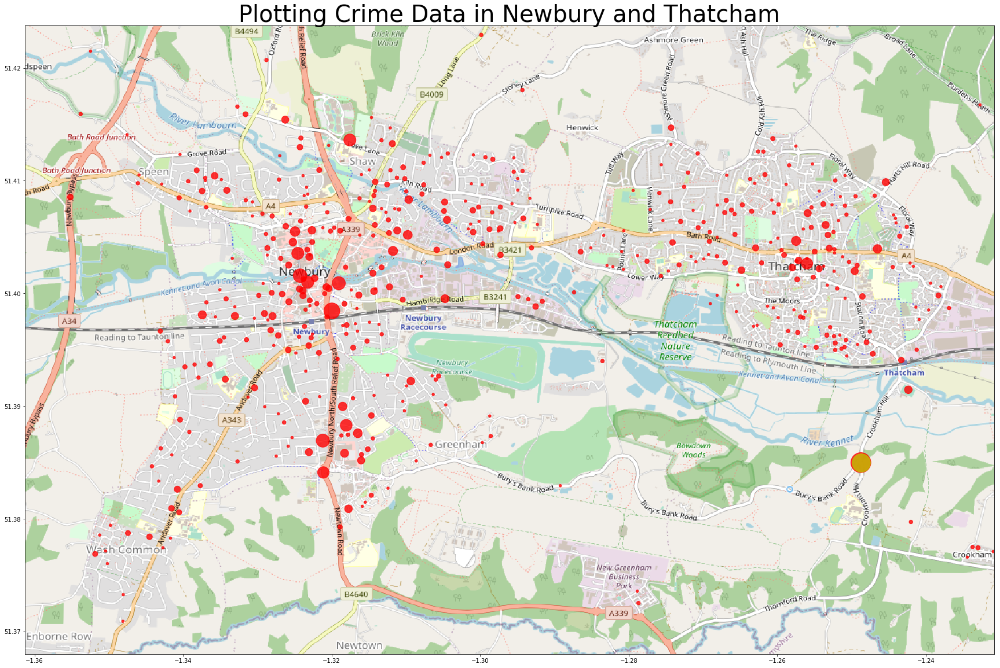

In [135]:
fig, ax = plt.subplots(figsize = (30,20))
ax.scatter(loc_freq.Longitude, loc_freq.Latitude, zorder=1, alpha= 0.8, c='r', s=loc_freq.Month*20)

ax.scatter(mflong, mflat, alpha= 0.8, zorder=5, c='y', s=1000)

ax.set_title('Plotting Crime Data in Newbury and Thatcham', fontsize=40)
ax.set_xlim(MapBox2[0],MapBox2[1])# not necessary at the moment
ax.set_ylim(MapBox2[2],MapBox2[3])# not necessary at the moment
ax.imshow(newbury_map2, zorder=0, extent = MapBox2, aspect= 'auto')

plt.show()